In [6]:
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel
from matplotlib.animation import FuncAnimation, PillowWriter
import warnings
warnings.filterwarnings('ignore')

# Fetch NVDA data
end_date = datetime.now()
start_date = end_date - timedelta(days=60)
nvda = yf.download('NVDA', start=start_date, end=end_date)
prices = nvda['Close'].values
dates = np.arange(len(prices)).reshape(-1, 1)
future_dates = np.arange(len(prices), len(prices) + 10).reshape(-1, 1)

# Normalize prices for better GP performance
price_mean = prices.mean()
price_std = prices.std()
prices_normalized = (prices - price_mean) / price_std

# Setup the plot
fig, ax = plt.subplots(figsize=(12, 6))

def animate(i):
    if i < 1:  # Need some initial data points
        return
    
    ax.clear()
    
    # Training data up to point i
    X_train = dates[:i]
    y_train = prices_normalized[:i]
    
    # Prediction range
    X_pred = np.vstack([dates[i:], future_dates])
    
    # Define and fit GP
    kernel = ConstantKernel(1.0) * RBF(length_scale=5.0)
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=3)
    gp.fit(X_train, y_train)
    
    # Make prediction
    y_pred, sigma = gp.predict(X_pred, return_std=True)
    
    # Denormalize for plotting
    y_pred = y_pred * price_std + price_mean
    sigma = sigma * price_std
    
    # Plot training data
    ax.plot(dates[:i], prices[:i], 'b.', label='Training Data')
    
    # Plot true future data
    if i < len(prices):
        ax.plot(dates[i:], prices[i:], 'g.', label='Future Data')
    
    # Plot prediction
    ax.plot(X_pred, y_pred, 'r-', label='GP Prediction')
    ax.fill_between(X_pred.flatten(), 
                    y_pred - 2 * sigma, 
                    y_pred + 2 * sigma, 
                    color='r', 
                    alpha=0.2, 
                    label='95% Confidence')
    
    # Customize plot
    ax.set_title(f'NVIDIA Stock Price Prediction (t={i})')
    ax.set_xlabel('Days')
    ax.set_ylabel('Price (USD)')
    ax.grid(True)
    ax.legend()
    
    # Set y-axis limits with some padding
    price_min, price_max = prices.min(), prices.max()
    padding = (price_max - price_min) * 0.2
    ax.set_ylim(price_min - padding, price_max + padding)

# Create animation
anim = FuncAnimation(fig, animate, frames=len(prices), 
                    interval=500, repeat=False)

# Save as GIF
writer = PillowWriter(fps=10)
anim.save('gp_nvda_forecast.gif', writer=writer)

plt.close()

[*********************100%***********************]  1 of 1 completed


[*********************100%***********************]  1 of 1 completed


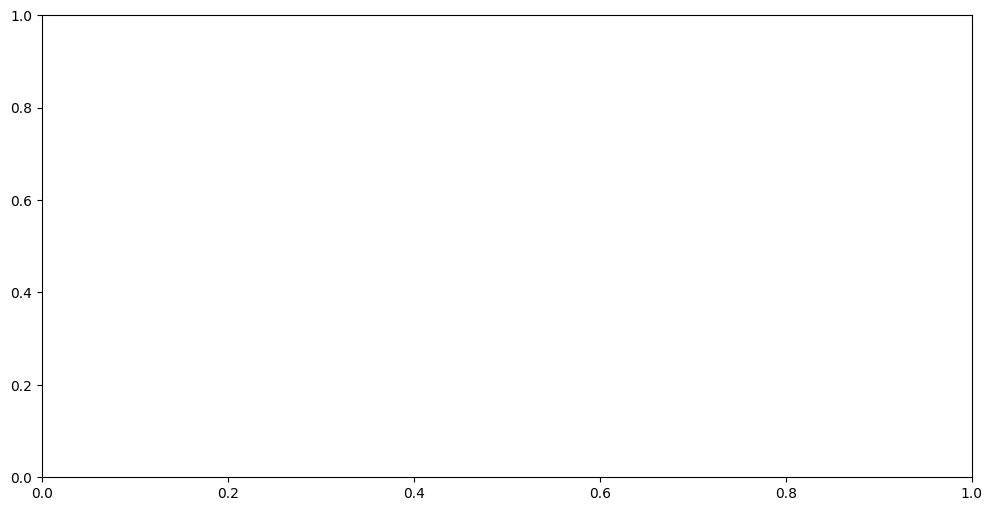

In [25]:
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel, ExpSineSquared, WhiteKernel
from matplotlib.animation import FuncAnimation, PillowWriter
import warnings
warnings.filterwarnings('ignore')

# Fetch NVDA data
end_date = datetime.now()
start_date = end_date - timedelta(days=60)
nvda = yf.download('NVDA', start=start_date, end=end_date)
prices = nvda['Close'].values
dates = np.arange(len(prices)).reshape(-1, 1)
future_dates = np.arange(len(prices), len(prices) + 10).reshape(-1, 1)

# Normalize prices for better GP performance
price_mean = prices.mean()
price_std = prices.std()
prices_normalized = (prices - price_mean) / price_std

# Setup the plot
fig, ax = plt.subplots(figsize=(12, 6))

def animate(i):
    if i < 1:  # Need some initial data points
        return
    
    ax.clear()
    
    # Training data up to point i
    X_train = dates[:i]
    y_train = prices_normalized[:i]
    
    # Prediction range (all previous points + future points)
    X_pred = np.vstack([dates[:i], future_dates])
    
    # Define and fit GP with optimized kernel
    trend_kernel = ConstantKernel(1.5) * RBF(length_scale=2.0)  # Trend component
    periodic_kernel = ConstantKernel(0.8) * ExpSineSquared(length_scale=1.0, periodicity=10.0)  # Periodic component
    noise_kernel = WhiteKernel(noise_level=0.05)  # Noise component
    kernel = trend_kernel + periodic_kernel + noise_kernel
    
    gp = GaussianProcessRegressor(kernel=kernel, alpha=0.1, n_restarts_optimizer=10)
    gp.fit(X_train, y_train)
    
    # Make prediction
    y_pred, sigma = gp.predict(X_pred, return_std=True)
    
    # Denormalize for plotting
    y_pred = y_pred * price_std + price_mean
    sigma = sigma * price_std
    
    # Plot training data
    ax.plot(dates[:i], prices[:i], 'b.', label='Training Data')
    
    # Plot true data (all points up to now)
    if i < len(prices):
        ax.plot(dates[i:], prices[i:], 'g.', label='True Future Data')
    
    # Plot prediction
    ax.plot(X_pred, y_pred, 'r-', label='GP Prediction')
    ax.fill_between(X_pred.flatten(), 
                    y_pred - 2 * sigma, 
                    y_pred + 2 * sigma, 
                    color='r', 
                    alpha=0.2, 
                    label='95% Confidence')
    
    # Customize plot
    ax.set_title(f'NVIDIA Stock Price Prediction with Reduced Variance (t={i})')
    ax.set_xlabel('Days')
    ax.set_ylabel('Price (USD)')
    ax.grid(True)
    ax.legend()
    
    # Set y-axis limits with some padding
    price_min, price_max = prices.min(), prices.max()
    padding = (price_max - price_min) * 0.2
    ax.set_ylim(price_min - padding, price_max + padding)

# Create animation
anim = FuncAnimation(fig, animate, frames=len(prices), 
                    interval=500, repeat=False)



In [26]:
# Save as GIF
writer = PillowWriter(fps=2)
anim.save('gp_nvda.gif', writer=writer)

plt.close()

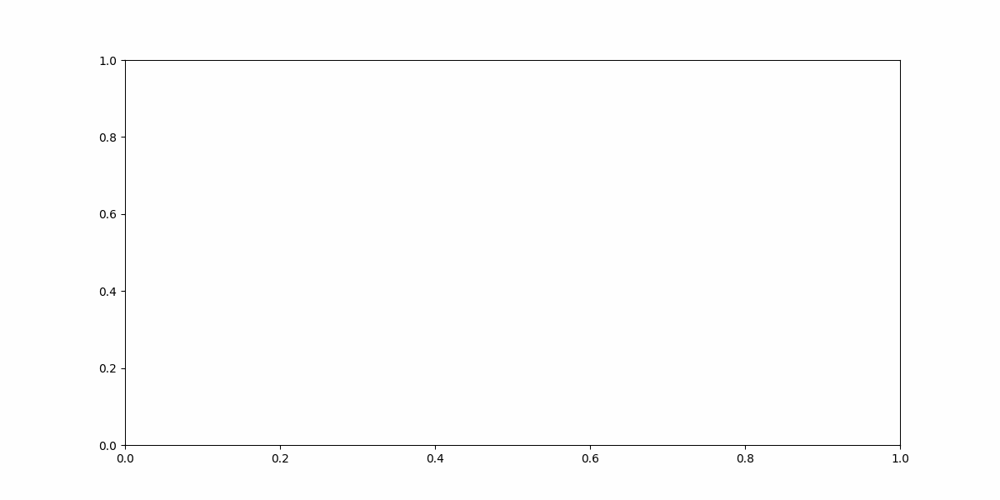

In [27]:
from IPython.display import Image, display

# Display the GIF
display(Image(filename='gp_nvda.gif'))


[*********************100%***********************]  1 of 1 completed


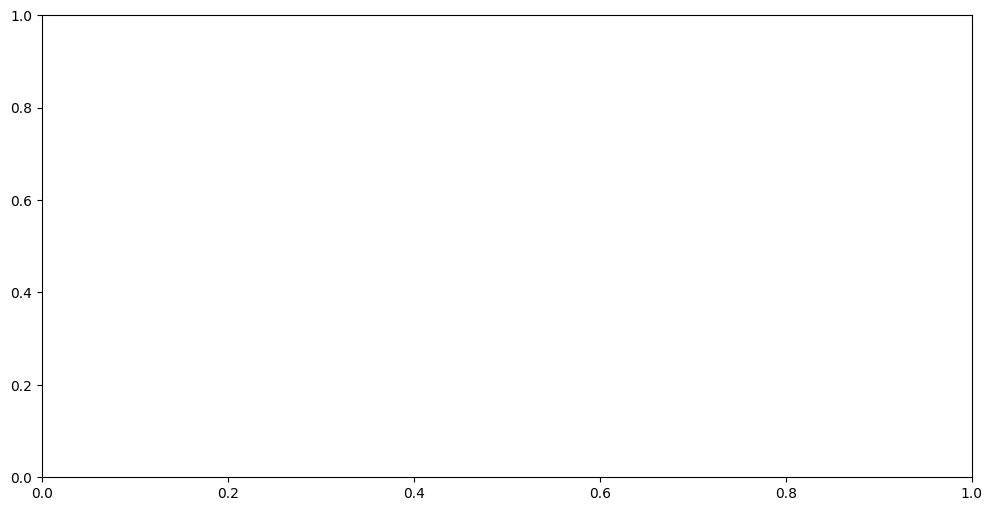

In [106]:
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Matern, ConstantKernel, DotProduct, WhiteKernel
from matplotlib.animation import FuncAnimation, PillowWriter
import warnings
warnings.filterwarnings('ignore')

# Fetch NVDA data
end_date = datetime.now()
days=200
start_date = end_date - timedelta(days=days)
nvda = yf.download('NVDA', start=start_date, end=end_date)
prices = nvda['Close'].values
dates = np.arange(len(prices)).reshape(-1, 1)
future_dates = np.arange(len(prices), len(prices) + 10).reshape(-1, 1)

# Normalize prices for better GP performance
price_mean = prices.mean()
price_std = prices.std()
prices_normalized = (prices - price_mean) / price_std

# Setup the plot
fig, ax = plt.subplots(figsize=(12, 6))

def animate(i):
    if i < 1:  # Need some initial data points
        return
    
    ax.clear()
    
    # Training data up to point i
    X_train = dates[:i]
    y_train = prices_normalized[:i]
    
    # Prediction range (all previous points + future points)
    X_pred = np.vstack([dates[:i], future_dates])
    
    # Define and fit GP with Matérn kernel for Brownian motion and drift
    brownian_kernel = Matern(length_scale=1.0, nu=0.2)  # Brownian motion
    drift_kernel = ConstantKernel(1.0) * DotProduct()  # Drift
    noise_kernel = WhiteKernel(noise_level=0.05)  # Noise
    kernel = brownian_kernel + drift_kernel + noise_kernel
    
    gp = GaussianProcessRegressor(kernel=kernel, alpha=0.1, n_restarts_optimizer=10)
    gp.fit(X_train, y_train)
    
    # Make prediction
    y_pred, sigma = gp.predict(X_pred, return_std=True)
    
    # Denormalize for plotting
    y_pred = y_pred * price_std + price_mean
    sigma = sigma * price_std
    
    # Plot training data
    ax.plot(dates[:i], prices[:i], 'b.', label='Training Data')
    
    # Plot true data (all points up to now)
    if i < len(prices):
        ax.plot(dates[i:], prices[i:], 'g.', label='True Future Data')
    
    # Plot prediction
    ax.plot(X_pred, y_pred, 'r-', label='GP Prediction')
    ax.fill_between(X_pred.flatten(), 
                    y_pred - 2 * sigma, 
                    y_pred + 2 * sigma, 
                    color='r', 
                    alpha=0.2, 
                    label='95% Confidence')
    
    # Customize plot
    ax.set_title(f'NVIDIA Stock Price Prediction with Matérn Kernel (t={i})')
    ax.set_xlabel('Days')
    ax.set_ylabel('Price (USD)')
    ax.grid(True)
    ax.legend()
    
    # Set y-axis limits with some padding
    price_min, price_max = prices.min(), prices.max()
    padding = (price_max - price_min) * 0.2
    ax.set_ylim(price_min - padding, price_max + padding)

# Create animation
anim = FuncAnimation(fig, animate, frames=len(prices), 
                    interval=500, repeat=False)



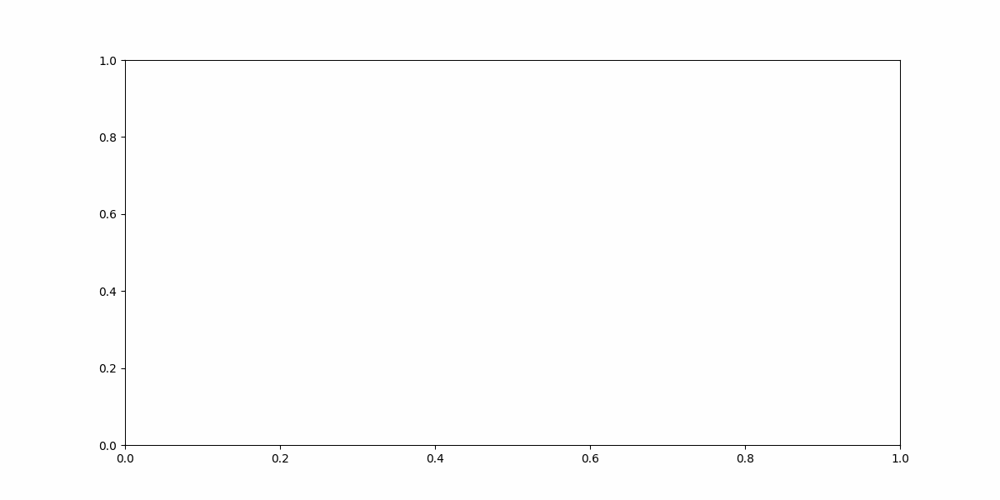

In [107]:
from IPython.display import Image, display

# Save as GIF
writer = PillowWriter(fps=2)
anim.save('gp_nvda.gif', writer=writer)

plt.close()
# Display the GIF
display(Image(filename='gp_nvda.gif'))

[*********************100%***********************]  1 of 1 completed


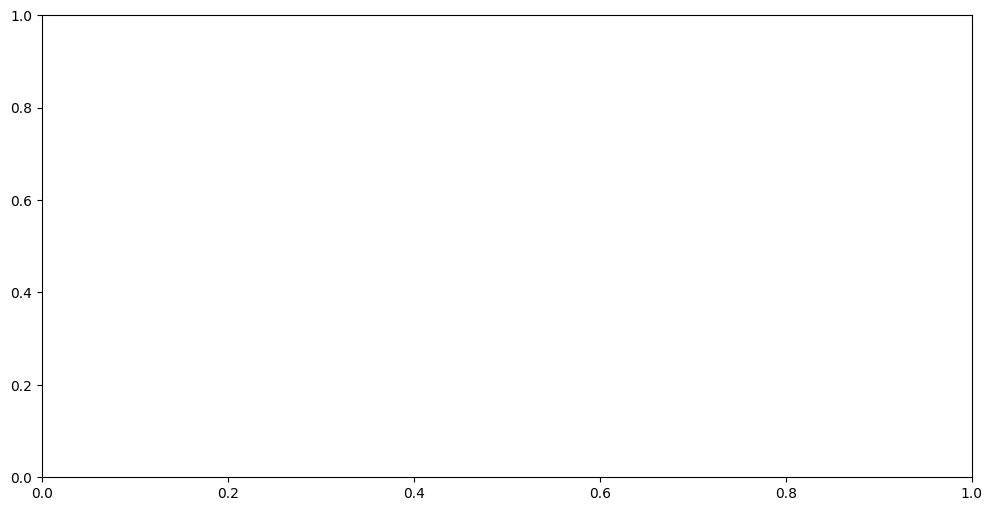

In [108]:
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import Kernel, Hyperparameter
from matplotlib.animation import FuncAnimation
import warnings
warnings.filterwarnings('ignore')

# Spectral Mixture Kernel Implementation
class SpectralMixtureKernel(Kernel):
    def __init__(self, num_mixtures=3):
        self.num_mixtures = num_mixtures
        # Initialize trainable parameters
        self.length_scales = np.random.uniform(1e-2, 1e1, num_mixtures)
        self.variances = np.random.uniform(1e-2, 1e1, num_mixtures)
        self.means = np.random.uniform(-0.5, 0.5, num_mixtures)

    def __call__(self, X, Y=None, eval_gradient=False):
        if Y is None:
            Y = X
        dists = np.abs(X[:, None] - Y[None, :])  # Pairwise absolute differences
        kernel_val = np.zeros_like(dists, dtype=float)
        for q in range(self.num_mixtures):
            kernel_val += (
                self.variances[q]
                * np.exp(-2 * (np.pi * self.length_scales[q] * dists) ** 2)
                * np.cos(2 * np.pi * self.means[q] * dists)
            )
        if eval_gradient:
            raise NotImplementedError("Gradient evaluation is not supported yet.")
        return kernel_val

    def diag(self, X):
        return np.sum(self.variances)

    def is_stationary(self):
        return True

# Fetch NVDA data
end_date = datetime.now()
days = 200
start_date = end_date - timedelta(days=days)
nvda = yf.download("NVDA", start=start_date, end=end_date)
prices = nvda["Close"].values
dates = np.arange(len(prices)).reshape(-1, 1)
future_dates = np.arange(len(prices), len(prices) + 10).reshape(-1, 1)

# Normalize prices for better GP performance
price_mean = prices.mean()
price_std = prices.std()
prices_normalized = (prices - price_mean) / price_std

# Setup the plot
fig, ax = plt.subplots(figsize=(12, 6))

def animate(i):
    if i < 1:  # Need some initial data points
        return

    ax.clear()

    # Training data up to point i
    X_train = dates[:i]
    y_train = prices_normalized[:i]

    # Prediction range (all previous points + future points)
    X_pred = np.vstack([dates[:i], future_dates])

    # Define and fit GP with Spectral Mixture Kernel
    spectral_kernel = SpectralMixtureKernel(num_mixtures=5)
    gp = GaussianProcessRegressor(kernel=spectral_kernel, alpha=0.1)
    gp.fit(X_train, y_train)

    # Make prediction
    y_pred, sigma = gp.predict(X_pred, return_std=True)

    # Denormalize for plotting
    y_pred = y_pred * price_std + price_mean
    sigma = sigma * price_std

    # Plot training data
    ax.plot(dates[:i], prices[:i], "b.", label="Training Data")

    # Plot true data (all points up to now)
    if i < len(prices):
        ax.plot(dates[i:], prices[i:], "g.", label="True Future Data")

    # Plot prediction
    ax.plot(X_pred, y_pred, "r-", label="GP Prediction")
    ax.fill_between(
        X_pred.flatten(),
        y_pred - 2 * sigma,
        y_pred + 2 * sigma,
        color="r",
        alpha=0.2,
        label="95% Confidence",
    )

    # Customize plot
    ax.set_title(f"NVIDIA Stock Price Prediction with Spectral Mixture Kernel (t={i})")
    ax.set_xlabel("Days")
    ax.set_ylabel("Price (USD)")
    ax.grid(True)
    ax.legend()

    # Set y-axis limits with some padding
    price_min, price_max = prices.min(), prices.max()
    padding = (price_max - price_min) * 0.2
    ax.set_ylim(price_min - padding, price_max + padding)

# Create animation
anim = FuncAnimation(fig, animate, frames=len(prices), interval=500, repeat=False)

# Show animation or save as needed
plt.show()


In [109]:
from IPython.display import Image, display

# Save as GIF
writer = PillowWriter(fps=2)
anim.save('gp_nvda_spectral.gif', writer=writer)

plt.close()
# Display the GIF
display(Image(filename='gp_nvda.gif'))

ValueError: Input array needs to be 2D but received a 3d-array.

MovieWriter imagemagick unavailable; using Pillow instead.


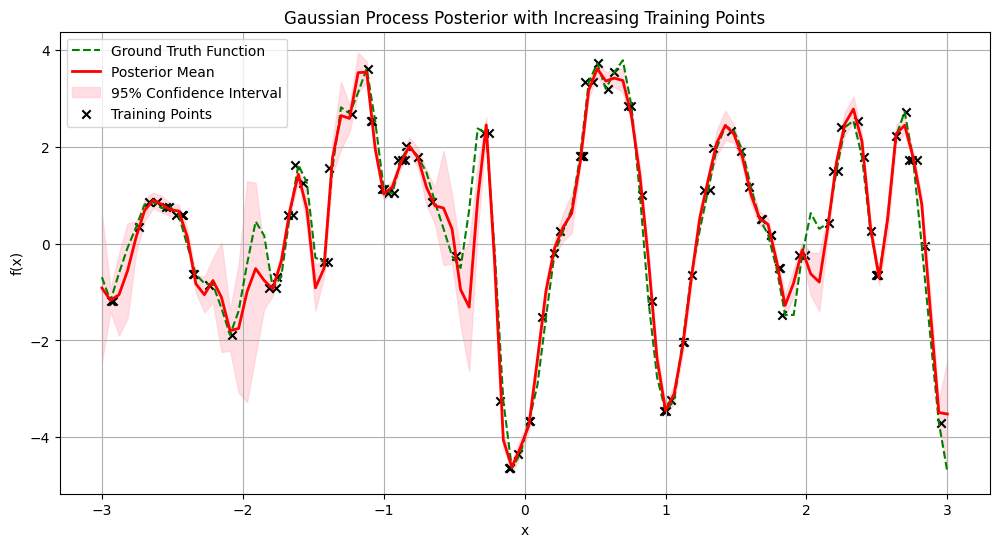

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Define the squared exponential (RBF) kernel
def rbf_kernel(x1, x2, length_scale=1.0, variance=1.0):
    """Compute the RBF kernel between two sets of inputs."""
    sqdist = np.sum(x1**2, 1).reshape(-1, 1) + np.sum(x2**2, 1) - 2 * np.dot(x1, x2.T)
    return variance * np.exp(-0.5 / length_scale**2 * sqdist)

# Define the GP prior and posterior computation
def gp_prior_and_posterior(X_train, y_train, X_test, length_scale=1.0, variance=1.0, noise_variance=1e-10):
    K = rbf_kernel(X_train, X_train, length_scale, variance) + noise_variance * np.eye(len(X_train))
    K_s = rbf_kernel(X_train, X_test, length_scale, variance)
    K_ss = rbf_kernel(X_test, X_test, length_scale, variance) + 1e-8 * np.eye(len(X_test))
    K_inv = np.linalg.inv(K)
    mu_s = K_s.T @ K_inv @ y_train
    cov_s = K_ss - K_s.T @ K_inv @ K_s
    return mu_s, cov_s

# Generate test data
X_test = np.linspace(-3, 3, 100).reshape(-1, 1)  # Test inputs

# Generate smoother ground truth noise as a GP sample
ground_truth_length_scale = 0.1
ground_truth_variance = 3.0
K_gt = rbf_kernel(X_test, X_test, length_scale=ground_truth_length_scale, variance=ground_truth_variance)
ground_truth_noise = np.random.multivariate_normal(np.zeros(len(X_test)), K_gt)

# Initialize training data
X_train = np.array([[]]).reshape(-1, 1)
y_train = np.array([])

# Parameters
length_scale = 0.1
variance = 3.0
noise_variance = 1e-2

# Set up the plot
fig, ax = plt.subplots(figsize=(12, 6))

def update(frame):
    global X_train, y_train
    ax.clear()

    # Sample a new random training point from the smooth ground truth
    new_x = np.random.uniform(-3, 3, 1).reshape(-1, 1)  # Random x value
    new_y = ground_truth_noise[np.argmin(np.abs(X_test - new_x))]  # Closest value in ground truth
    X_train = np.vstack([X_train, new_x]) if X_train.size else new_x
    y_train = np.append(y_train, new_y)

    # Compute the posterior
    mu_s, cov_s = gp_prior_and_posterior(X_train, y_train, X_test, length_scale, variance, noise_variance)
    std_s = np.sqrt(np.diag(cov_s))

    # Plot the ground truth noise
    ax.plot(X_test, ground_truth_noise, 'g--', label="Ground Truth Function")
    
    # Plot the mean and confidence interval
    ax.plot(X_test, mu_s, 'r', lw=2, label="Posterior Mean")
    ax.fill_between(X_test.ravel(),
                    mu_s.ravel() - 1.96 * std_s,
                    mu_s.ravel() + 1.96 * std_s,
                    color="pink", alpha=0.5, label="95% Confidence Interval")
    
    # Scatter plot of training points
    ax.scatter(X_train, y_train, c="black", marker="x", label="Training Points")

    # Plot formatting
    ax.set_title("Gaussian Process Posterior with Increasing Training Points")
    ax.set_xlabel("x")
    ax.set_ylabel("f(x)")
    ax.legend()
    ax.grid()

# Create the animation
ani = FuncAnimation(fig, update, frames=100, repeat=False)

# Save the animation as a GIF
ani.save("gp_smooth_ground_truth.gif", writer="imagemagick", fps=3)


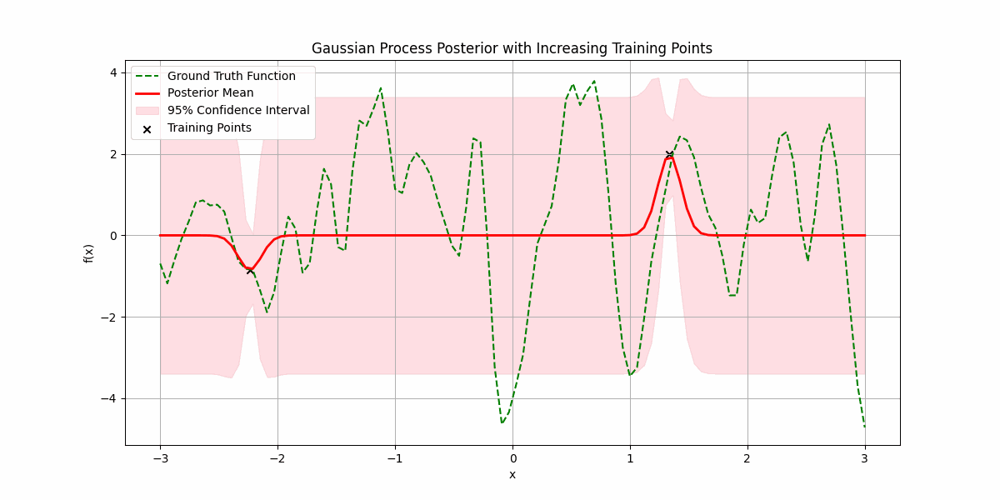

In [61]:
display(Image(filename='gp_smooth_ground_truth.gif'))

MovieWriter imagemagick unavailable; using Pillow instead.
MovieWriter imagemagick unavailable; using Pillow instead.


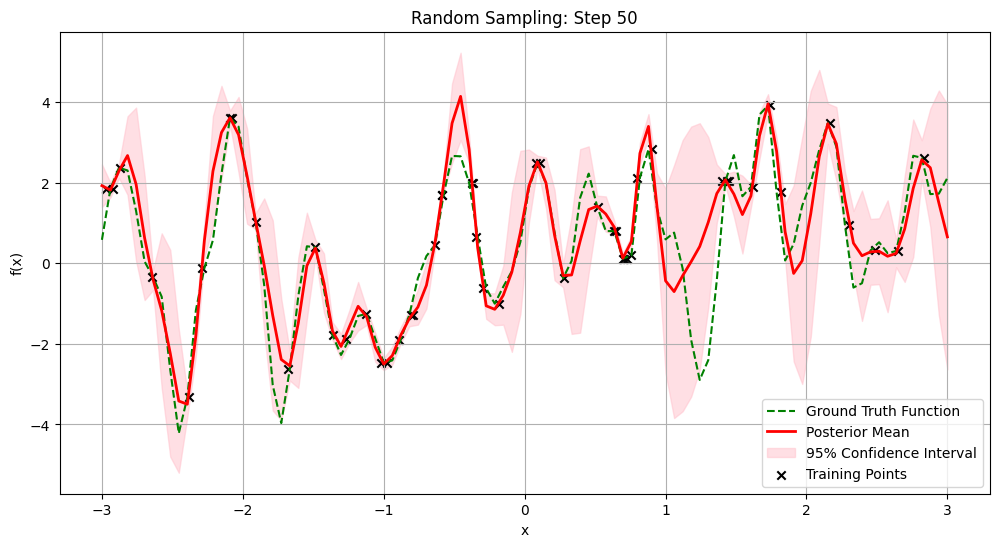

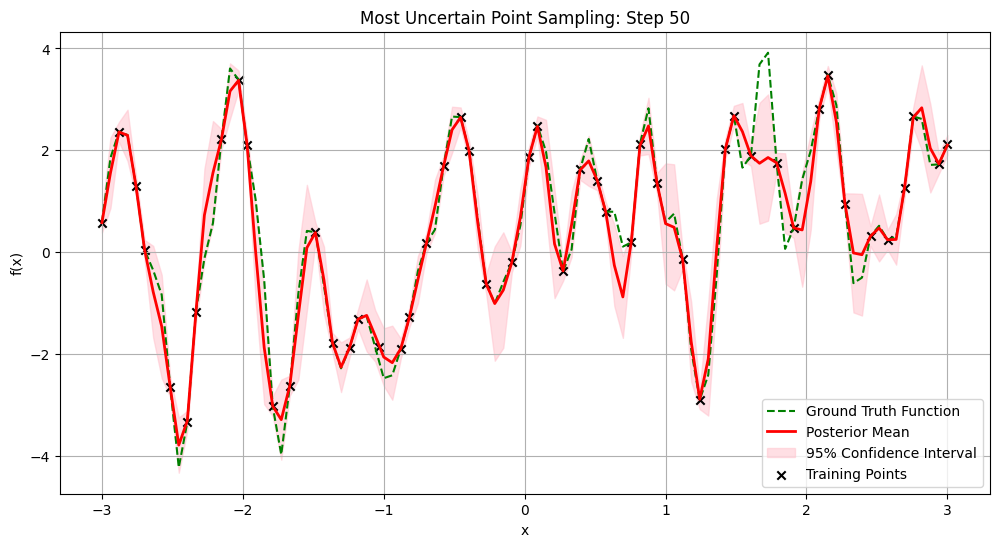

In [91]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Define the squared exponential (RBF) kernel
def rbf_kernel(x1, x2, length_scale=1.0, variance=1.0):
    """Compute the RBF kernel between two sets of inputs."""
    sqdist = np.sum(x1**2, 1).reshape(-1, 1) + np.sum(x2**2, 1) - 2 * np.dot(x1, x2.T)
    return variance * np.exp(-0.5 / length_scale**2 * sqdist)

# Define the GP prior and posterior computation
def gp_prior_and_posterior(X_train, y_train, X_test, length_scale=1.0, variance=1.0, noise_variance=1e-10):
    K = rbf_kernel(X_train, X_train, length_scale, variance) + noise_variance * np.eye(len(X_train))
    K_s = rbf_kernel(X_train, X_test, length_scale, variance)
    K_ss = rbf_kernel(X_test, X_test, length_scale, variance) + 1e-8 * np.eye(len(X_test))
    K_inv = np.linalg.inv(K)
    mu_s = K_s.T @ K_inv @ y_train
    cov_s = K_ss - K_s.T @ K_inv @ K_s
    return mu_s, cov_s

# Generate test data
X_test = np.linspace(-3, 3, 100).reshape(-1, 1)  # Test inputs

# Generate smoother ground truth noise as a GP sample
ground_truth_length_scale = 0.1
ground_truth_variance = 3.0
K_gt = rbf_kernel(X_test, X_test, length_scale=ground_truth_length_scale, variance=ground_truth_variance)
ground_truth_noise = np.random.multivariate_normal(np.zeros(len(X_test)), K_gt)

# Parameters for GP
length_scale = 0.1
variance = 3.0
noise_variance = 1e-2

# Initialize training data globally for both animations
X_train_random = np.array([[]]).reshape(-1, 1)
y_train_random = np.array([])

X_train_uncertain = np.array([[]]).reshape(-1, 1)
y_train_uncertain = np.array([])

# Random Sampling Animation
fig_random, ax_random = plt.subplots(figsize=(12, 6))

def init_random():
    global X_train_random, y_train_random
    X_train_random = np.array([[]]).reshape(-1, 1)
    y_train_random = np.array([])

def update_random(frame):
    global X_train_random, y_train_random
    ax_random.clear()

    # Sample a new random training point
    new_x = np.random.uniform(-3, 3, 1).reshape(-1, 1)
    new_y = ground_truth_noise[np.argmin(np.abs(X_test - new_x))]
    X_train_random = np.vstack([X_train_random, new_x]) if X_train_random.size else new_x
    y_train_random = np.append(y_train_random, new_y)

    # Compute the posterior
    mu_s, cov_s = gp_prior_and_posterior(X_train_random, y_train_random, X_test, length_scale, variance, noise_variance)
    std_s = np.sqrt(np.diag(cov_s))

    # Plot
    ax_random.plot(X_test, ground_truth_noise, 'g--', label="Ground Truth Function")
    ax_random.plot(X_test, mu_s, 'r', lw=2, label="Posterior Mean")
    ax_random.fill_between(X_test.ravel(),
                           mu_s.ravel() - 1.96 * std_s,
                           mu_s.ravel() + 1.96 * std_s,
                           color="pink", alpha=0.5, label="95% Confidence Interval")
    ax_random.scatter(X_train_random, y_train_random, c="black", marker="x", label="Training Points")
    ax_random.set_title(f"Random Sampling: Step {frame + 1}")
    ax_random.set_xlabel("x")
    ax_random.set_ylabel("f(x)")
    ax_random.legend()
    ax_random.grid()

ani_random = FuncAnimation(fig_random, update_random, frames=50, init_func=init_random, repeat=False)
ani_random.save("gp_random_sampling.gif", writer="imagemagick", fps=3)

# Most Uncertain Point Sampling Animation
fig_uncertain, ax_uncertain = plt.subplots(figsize=(12, 6))

def init_uncertain():
    global X_train_uncertain, y_train_uncertain
    X_train_uncertain = np.array([[]]).reshape(-1, 1)
    y_train_uncertain = np.array([])

def update_uncertain(frame):
    global X_train_uncertain, y_train_uncertain
    ax_uncertain.clear()

    if X_train_uncertain.size == 0:
        # Initialize with a random point
        new_x = np.random.uniform(-3, 3, 1).reshape(-1, 1)
    else:
        # Compute the posterior mean and variance
        mu_s, cov_s = gp_prior_and_posterior(X_train_uncertain, y_train_uncertain, X_test, length_scale, variance, noise_variance)
        std_s = np.sqrt(np.diag(cov_s))

        # Find the most uncertain point
        most_uncertain_idx = np.argmax(std_s)
        new_x = X_test[most_uncertain_idx].reshape(-1, 1)

    # Get the corresponding ground truth value
    new_y = ground_truth_noise[np.argmin(np.abs(X_test - new_x))]
    X_train_uncertain = np.vstack([X_train_uncertain, new_x]) if X_train_uncertain.size else new_x
    y_train_uncertain = np.append(y_train_uncertain, new_y)

    # Compute the posterior
    mu_s, cov_s = gp_prior_and_posterior(X_train_uncertain, y_train_uncertain, X_test, length_scale, variance, noise_variance)
    std_s = np.sqrt(np.diag(cov_s))

    # Plot
    ax_uncertain.plot(X_test, ground_truth_noise, 'g--', label="Ground Truth Function")
    ax_uncertain.plot(X_test, mu_s, 'r', lw=2, label="Posterior Mean")
    ax_uncertain.fill_between(X_test.ravel(),
                              mu_s.ravel() - 1.96 * std_s,
                              mu_s.ravel() + 1.96 * std_s,
                              color="pink", alpha=0.5, label="95% Confidence Interval")
    ax_uncertain.scatter(X_train_uncertain, y_train_uncertain, c="black", marker="x", label="Training Points")
    ax_uncertain.set_title(f"Most Uncertain Point Sampling: Step {frame + 1}")
    ax_uncertain.set_xlabel("x")
    ax_uncertain.set_ylabel("f(x)")
    ax_uncertain.legend()
    ax_uncertain.grid()

ani_uncertain = FuncAnimation(fig_uncertain, update_uncertain, frames=50, init_func=init_uncertain, repeat=False)
ani_uncertain.save("gp_most_uncertain_sampling.gif", writer="imagemagick", fps=3)


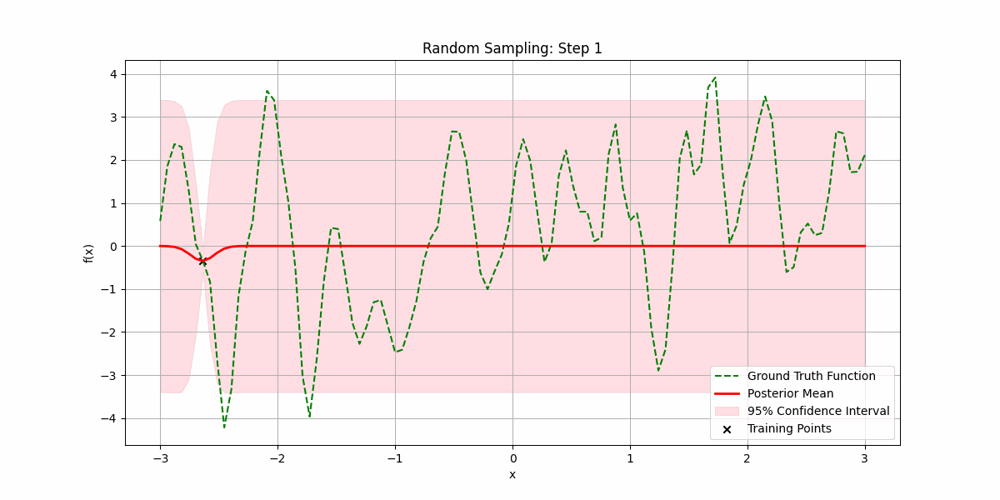

In [92]:
display(Image(filename='gp_random_sampling.gif'))

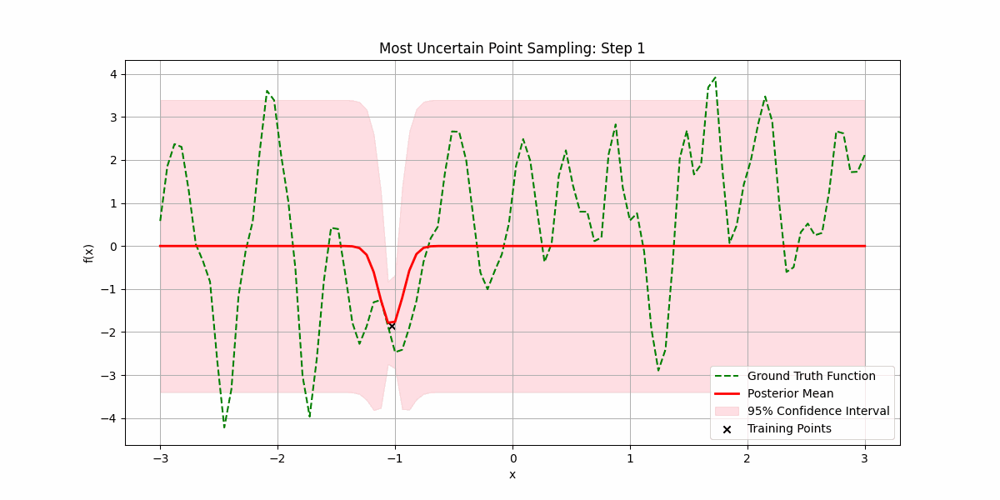

In [93]:
display(Image(filename='gp_most_uncertain_sampling.gif'))